In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

# Imports and Paths

In [2]:
from pathlib import Path
import gc
from functools import partial
import time
import datetime
import os

import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import scipy.linalg
import copy
import sklearn
import rastermap
import pandas as pd
from tqdm.notebook import tqdm

import tensorly as tl
import tensorly.decomposition
import torch

In [3]:
# import sys
# sys.path.append(str(dir_github))

%load_ext autoreload
%autoreload 2
from bnpm import torch_helpers, file_helpers, timeSeries, ca2p_preprocessing, welford_moving_2D, linear_regression, similarity, spectral, featurization, decomposition, h5_handling, math_functions, misc, plotting_helpers, path_helpers, indexing

%load_ext autoreload
%autoreload 2
import roicat

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
%load_ext autoreload
%autoreload 2
import bmi_idap

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
%matplotlib inline

In [6]:
params = {}
results = {}

In [7]:
results['general'] = {}

results['general']['datetime'] = str(datetime.datetime.now())
results['general']['cwd'] = os.getcwd()

In [8]:
params['paths'] = {}

params['paths']['dir_analysisFiles'] = str(Path(r'/media/rich/bigSSD/analysis_data/BMI/day0_stuff/mouse_0403L').resolve())

## Directory with F.npy, stat.npy etc.
params['paths']['dir_s2p']   = str(Path(r'/media/rich/bigSSD/data_raw/BMI/mouse_0403L/20230703/scanimage_data/exp/jobNum_0/suite2p/plane0').resolve())

## Path of z-stack and z-position trace
params['paths']['path_zStack']    = str(Path('/media/rich/bigSSD/analysis_data/BMI/day0_stuff/mouse_0403L/zstack/zstack_bulk_00001_00001.tif'))


## Path of iscell. Can be from neural net output (iscell_NN)
params['paths']['path_roicat_classification'] = str(Path(params['paths']['dir_analysisFiles']) / 'mouse_0403L_20230702_and_20230703.ROICaT.classification_drawn.results.pkl')

## Path of tqm (trace quality metrics). Used to get dFoF parameters
params['paths']['trace_quality'] = str(Path(params['paths']['dir_analysisFiles']) / 'trace_quality.pkl')


params['paths']['dir_save']       =  copy.copy(params['paths']['dir_analysisFiles'])
params['paths']['path_save_weights'] = str(Path(params['paths']['dir_save']) / 'weights_day0')
params['paths']['path_save_results'] = str(Path(params['paths']['dir_save']) / 'decoder_definition')

In [9]:
params['general'] = {}

params['general']['use_gpu'] = True

In [10]:
device = torch_helpers.set_device(use_GPU=params['general']['use_gpu'])

results['device'] = device

devices available: [_CudaDeviceProperties(name='NVIDIA GeForce RTX 3090', major=8, minor=6, total_memory=24226MB, multi_processor_count=82)]
Using device: 'cuda:0': _CudaDeviceProperties(name='NVIDIA GeForce RTX 3090', major=8, minor=6, total_memory=24226MB, multi_processor_count=82)


# IMPORT DATA

In [11]:
roicat_classification = file_helpers.pickle_load(params['paths']['path_roicat_classification'])
trace_quality = file_helpers.pickle_load(params['paths']['trace_quality'])
# z_positions = h5_handling.simple_load(params['paths']['path_zPositions'], return_lazy=False)['zPositions']

In [12]:
F, Fneu, iscell_s2p, ops, spks_s2p, stat = ca2p_preprocessing.import_s2p(params['paths']['dir_s2p'])
n_frames, n_rois = F.shape[1], F.shape[0]
Fs = ops['fs']

In [13]:
stat = np.load(str(Path(params['paths']['dir_s2p']) / 'stat.npy'), allow_pickle=True)[()]
ops  = np.load(str(Path(params['paths']['dir_s2p']) / 'ops.npy'), allow_pickle=True)[()]

In [14]:
frame_height, frame_width = ops['meanImg'].shape[0], ops['meanImg'].shape[1]

sf = roicat.data_importing.Data_suite2p._transform_statFile_to_spatialFootprints(
    frame_height_width=(frame_height, frame_width),
    stat=stat,
    normalize_mask=False,
)

In [15]:
iscell = (roicat_classification['preds'][-1] * trace_quality['iscell_tqm']).astype(np.bool_)

In [16]:
params['ROIs'] = {}

params['ROIs']['idx_session_toUse'] = -1
params['ROIs']['path_session_toUse'] = params['paths']['dir_s2p']

frame_height, frame_width = ops['meanImg'].shape[0], ops['meanImg'].shape[1]

data_rois = roicat.data_importing.Data_suite2p(str(Path(params['paths']['dir_s2p']).resolve() / 'stat.npy'), FOV_height_width=(frame_height, frame_width))
sf_sessionToUse_all    = data_rois.spatialFootprints
sfneu_sessionToUse_all = data_rois.import_neuropil_masks()

sf    = data_rois.spatialFootprints[-1][iscell]
sfneu = data_rois.import_neuropil_masks()[-1][iscell]
 
results['ROIs'] = {}
results['ROIs']['spatial_footprints'] = sf
results['ROIs']['sfneu'] = sfneu

Completed: Set FOV_height and FOV_width successfully.
Importing spatial footprints from stat files.


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.77it/s]


Imported 1 sessions of spatial footprints into sparse arrays.
Completed: Set spatialFootprints for 1 sessions successfully.
Completed: Created session_bool.
Completed: Created centroids.
Staring: Creating centered ROI images from spatial footprints...
Completed: Created ROI images.
Importing neuropil masks from stat files.


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.65it/s]


Imported 1 sessions of neuropil masks into sparse arrays.
Importing neuropil masks from stat files.


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.62it/s]

Imported 1 sessions of neuropil masks into sparse arrays.


In [17]:
results['data'] = {}

results['data']['n_rois'] = n_rois
results['data']['Fs'] = Fs
results['data']['frame_height'] = frame_height
results['data']['frame_width'] = frame_width


In [34]:
zstack_dense = ca2p_preprocessing.import_tiffs_SI(
    params['paths']['path_zStack'],
#     clip_zero=True,
    dtype=None,
)

In [37]:
params['zstack'] = {}

params['zstack']['frames_to_discard_per_slice'] = 30
# params['zstack']['sparse_step_size_um'] = 2.0

zstack_sparse, positions_z, idx_slices = ca2p_preprocessing.dense_stack_to_sparse_stack_SI(
    stack_in=zstack_dense,
    scanimage_metadata=ca2p_preprocessing.get_ScanImage_tiff_metadata(params['paths']['path_zStack']),
    frames_to_discard_per_slice=params['zstack']['frames_to_discard_per_slice'],
#     sparse_step_size_um=params['zstack']['sparse_step_size_um'],
#     reduction=partial(np.percentile, q=30),
)

results['zstack'] = {}

results['zstack']['zstack_sparse'] = zstack_sparse
results['zstack']['positions_z'] = positions_z
results['zstack']['idx_slices'] = idx_slices


Args found from scanimage_metadata:
  num_frames_per_slice = 60
  num_slices =           101
  num_volumes =          3
  step_size_um =         2.0

stack_in.shape =         (18180, 512, 1024)
stack_out.shape =        (51, 512, 1024)
positions_z =            -100.0, -96.0, -92.0, -88.0, -84.0, -80.0, -76.0, -72.0, -68.0, -64.0, -60.0, -56.0, -52.0, -48.0, -44.0, -40.0, -36.0, -32.0, -28.0, -24.0, -20.0, -16.0, -12.0, -8.0, -4.0, 0.0, 4.0, 8.0, 12.0, 16.0, 20.0, 24.0, 28.0, 32.0, 36.0, 40.0, 44.0, 48.0, 52.0, 56.0, 60.0, 64.0, 68.0, 72.0, 76.0, 80.0, 84.0, 88.0, 92.0, 96.0, 100.0, 
idx_slices =             [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100]



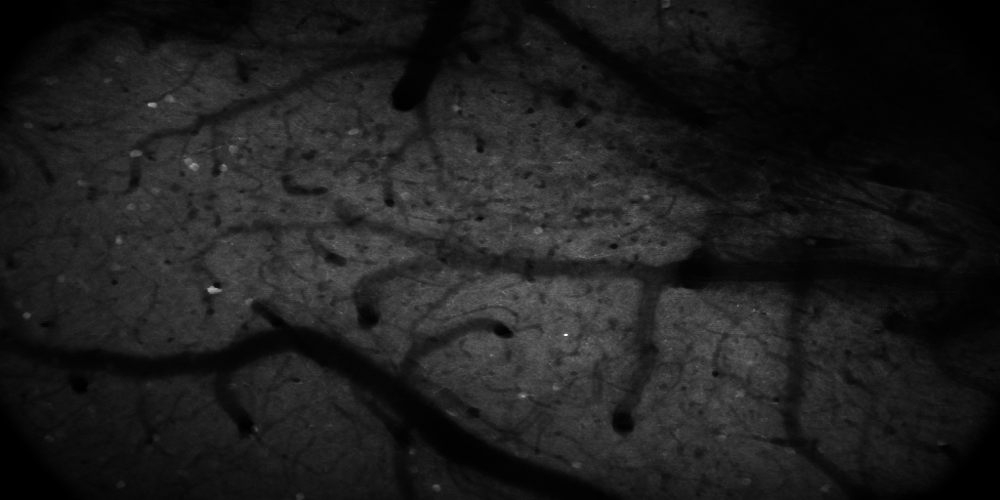

In [40]:
plotting_helpers.display_toggle_image_stack(zstack_sparse, clim=[0,10000])

In [49]:
import sparse

sf_sparse = sparse.COO(sf).reshape((sf.shape[0], frame_height, frame_width))
sfneu_sparse = sparse.COO(sfneu).reshape((sfneu.shape[0], frame_height, frame_width))

# F_dZ    = (zstack_sparse[:,None,:,:] * sf_sparse[None,:,:,:]).sum(axis=(-2,-1)).todense()
F_dZ = ((zstack_sparse[:,None,:,:] * sf_sparse[None,:,:,:]).sum(axis=(-2,-1)) / sf_sparse.sum(axis=(-2,-1))).todense()
Fneu_dZ = ((zstack_sparse[:,None,:,:] * sfneu_sparse[None,:,:,:]).sum(axis=(-2,-1)) / sfneu_sparse.sum(axis=(-2,-1))).todense()

# FneuSub_dZ = F_dZ - Fneu_dZ*params['dFoF']['neuropil_fraction']

params['zstack']['sig_smooth_z'] = 1.5
# FneuSub_dZ_conv = timeSeries.simple_smooth(FneuSub_dZ, x=np.linspace(-FneuSub_dZ.shape[0]//2, FneuSub_dZ.shape[0]//2, FneuSub_dZ.shape[0]), sig=params['zstack']['sig_smooth_z'], axis=0)
F_dZ_conv = timeSeries.simple_smooth(F_dZ, x=np.linspace(-F_dZ.shape[0]//2, F_dZ.shape[0]//2, F_dZ.shape[0]), sig=params['zstack']['sig_smooth_z'], axis=0)
Fneu_dZ_conv = timeSeries.simple_smooth(Fneu_dZ, x=np.linspace(-Fneu_dZ.shape[0]//2, Fneu_dZ.shape[0]//2, Fneu_dZ.shape[0]), sig=params['zstack']['sig_smooth_z'], axis=0)

results['zstack']['F_dZ'] = F_dZ
results['zstack']['Fneu_dZ'] = Fneu_dZ
results['zstack']['F_dZ_conv'] = F_dZ_conv
results['zstack']['Fneu_dZ_conv'] = Fneu_dZ_conv

visually check out the trace and distribution of the z_positions time series to see where the 'baseline' / 0-point is

In [52]:
params['zstack']['z0_component'] = -1.7
params['zstack']['dZ_component'] = 6

idx_position_0 = np.abs(np.array(positions_z) + params['zstack']['z0_component']).argmin()
idx_position_plus = np.abs(np.array(positions_z) + params['zstack']['dZ_component']).argmin()
idx_position_minus = np.abs(np.array(positions_z) - params['zstack']['dZ_component']).argmin()

FoF_dZ_conv = F_dZ_conv / F_dZ_conv[idx_position_0]
FneuoF_dZ_conv = Fneu_dZ_conv / Fneu_dZ_conv[idx_position_0]

FneuSub_dZ_conv = F_dZ_conv - 0.7*Fneu_dZ_conv
dFneuSuboF_dZ_conv = (FneuSub_dZ_conv - FneuSub_dZ_conv[idx_position_0]) / FneuSub_dZ_conv[idx_position_0]
# dFoF_dZ_conv = ((F_dZ_conv - Fneu_dZ_conv*0.7) - (F_dZ_conv - Fneu_dZ_conv*0.7)[idx_position_0]) / (F_dZ_conv - Fneu_dZ_conv*0.7)[idx_position_0]

component_z_plus = dFneuSuboF_dZ_conv[idx_position_plus]
component_z_minus = dFneuSuboF_dZ_conv[idx_position_minus]

results['zstack']['idx_position_0'] = idx_position_0
results['zstack']['idx_position_plus'] = idx_position_plus
results['zstack']['idx_position_minus'] = idx_position_minus
results['zstack']['FoF_dZ_conv'] = FoF_dZ_conv
results['zstack']['FneuoF_dZ_conv'] = FneuoF_dZ_conv
# results['zstack']['component_z_plus'] = component_z_plus
# results['zstack']['component_z_minus'] = component_z_minus

Text(0.5, 1.0, 'F or Fneu / dZ')

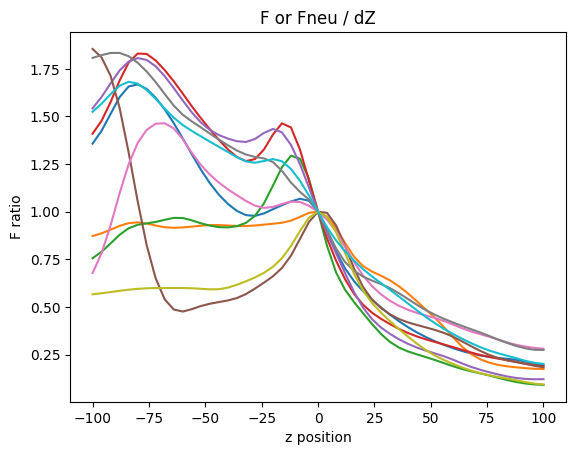

In [53]:
plt.figure()
# plt.plot(positions_z, F_dZ[:,:200]);
plt.plot(positions_z, (F_dZ_conv / F_dZ_conv[idx_position_0])[:,:10]);
# plt.plot(positions_z, Fneu_dZ[:,:200]);
# plt.plot(positions_z, (Fneu_dZ_conv / Fneu_dZ_conv[idx_position_0])[:,:20]);
plt.xlabel('z position')
plt.ylabel('F ratio')
plt.title('F or Fneu / dZ')

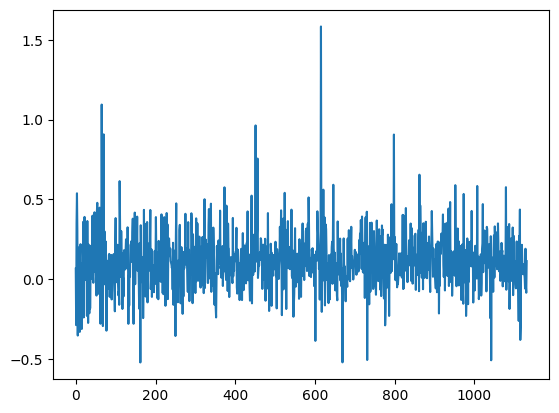

In [56]:
plt.figure()
plt.plot(component_z_plus)

Text(0.5, 1.0, 'F or Fneu / dZ')

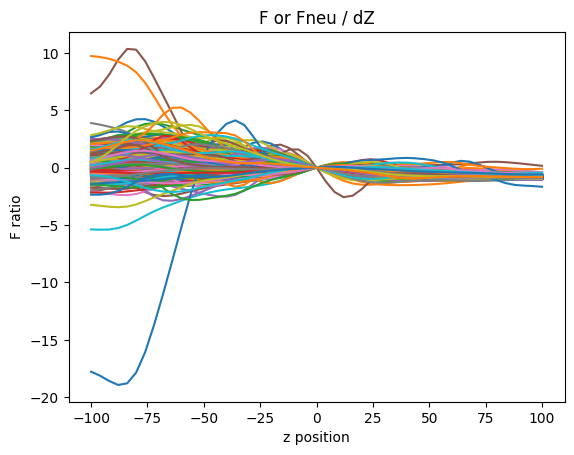

In [58]:
plt.figure()
# plt.plot(positions_z, F_dZ[:,:200]);
# plt.plot(positions_z, (F_dZ_conv / F_dZ_conv[idx_position_0])[:,:200]);
plt.plot(positions_z, dFneuSuboF_dZ_conv)
# plt.plot(positions_z, FneuSub_dZ_conv[:,iscell][:,:])
# plt.plot(positions_z, Fneu_dZ[:,:]);
# plt.plot(positions_z, (Fneu_dZ_conv / Fneu_dZ_conv[idx_position_0])[:,:20]);
plt.xlabel('z position')
plt.ylabel('F ratio')
plt.title('F or Fneu / dZ')

<IPython.core.display.Javascript object>


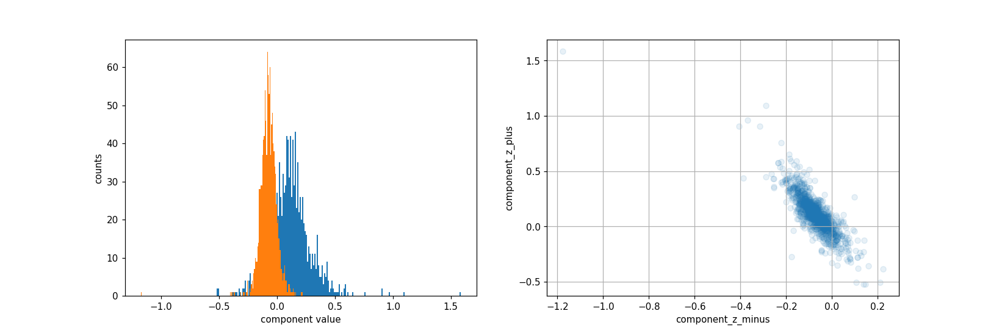

In [60]:
%matplotlib notebook

fig, axs = plt.subplots(1,2, figsize=(15,5))
axs[0].hist(component_z_plus, 200);
axs[0].hist(component_z_minus, 200);
axs[0].set_xlabel('component value')
axs[0].set_ylabel('counts')

axs[1].scatter(component_z_minus, component_z_plus, alpha=0.1)
axs[1].grid()
axs[1].set_xlabel('component_z_minus')
axs[1].set_ylabel('component_z_plus');

Calculate the expected dF/F scaling factor at each time point for each ROI. Interpolate the expected `FneuSubOF_dZ` value for each neuron at the calculated z-position for that frame.

# Prepare dFoF

In [18]:
params['dFoF'] = {}

# params['dFoF']['max_z_displacement'] = 2.5


idx_time_bad = np.arange(0,0)
# idx_time_bad =+ np.where(np.abs(z_positions) > params['dFoF']['max_z_displacement'])[0]

idx_time_good = np.arange(n_frames)[~np.isin(np.arange(n_frames), idx_time_bad)]

results['idx_time_bad'] = idx_time_bad

print(f'num excluded time points: {len(idx_time_bad)}')

num excluded time points: 0


In [19]:
F_toUse = F[iscell][:, idx_time_good]
Fneu_toUse = Fneu[iscell][:, idx_time_good]

In [20]:
params['dFoF']['channelOffset_correction'] = trace_quality['dFoF_params']['channelOffset_correction']
params['dFoF']['percentile_baseline'] = trace_quality['dFoF_params']['percentile_baseline']
params['dFoF']['neuropil_fraction'] = trace_quality['dFoF_params']['neuropil_fraction']
params['dFoF']['win_rolling_percentile'] = int(10*60*results['data']['Fs'])  ## In frames
params['dFoF']['roll_stride'] = 10  ## In frames

In [21]:
# dFoF with reduced percentile for baseline

dFoF, dF, F_neuSub, F_baseline = ca2p_preprocessing.make_dFoF(
    F=F_toUse,
    Fneu=Fneu_toUse,
    neuropil_fraction=params['dFoF']['neuropil_fraction'],
    percentile_baseline=params['dFoF']['percentile_baseline'],
    rolling_percentile_window=int(params['dFoF']['win_rolling_percentile']),
    channelOffset_correction=params['dFoF']['channelOffset_correction'],
    roll_stride=params['dFoF']['roll_stride'],
    multicore_pref=True,
    verbose=True
)
# # Threshold for nonnegativity
# dFoF_z = dFoF / np.std(dFoF,axis=1,keepdims=True)

100%|██████████████████████████████████████████| 34/34 [00:00<00:00, 125.29it/s]


Calculated dFoF. Total elapsed time: 1.5 seconds


In [22]:
# dFoF = np.nan_to_num(dFoF)

### Look at rastermap

In [23]:
import rastermap

In [24]:
rmap = rastermap.Rastermap(
    n_components=1,
    n_X=40,
    nPC=200,
    init='pca',
    alpha=1.0,
    K=1.0,
    mode='basic',
    verbose=True,
    annealing=True,
    constraints=2,
)

In [25]:
# X = scipy.stats.zscore(dFoF, axis=0).T
# X = scipy.stats.zscore(dFoF, axis=1)
# X = dFoF / np.std(dFoF, axis=1, keepdims=True)
X = dFoF.copy()
rmap.fit(X)

nmin 200
0.07480692863464355
5.554638385772705
5.861946105957031
5.8651885986328125
(38, 40)
(70,)
1.0
time; iteration;  explained PC variance
0.29s     0        0.0769      2
0.34s    10        0.1904      4
0.37s    20        0.2107      8
0.39s    30        0.2599      18
0.42s    40        0.3055      28
0.45s    50        0.3451      38
0.51s    60        0.3454      38
0.55s   final      0.3454
0.55s upsampled    0.3454


<IPython.core.display.Javascript object>


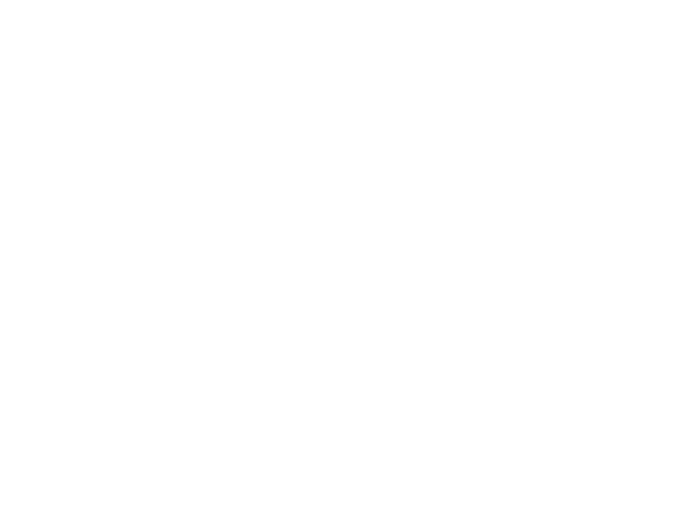

In [26]:
%matplotlib notebook

plt.figure()
plt.imshow(X[rmap.isort][:], aspect='auto', vmin=-0.4, vmax=1)

# %matplotlib inline

<IPython.core.display.Javascript object>


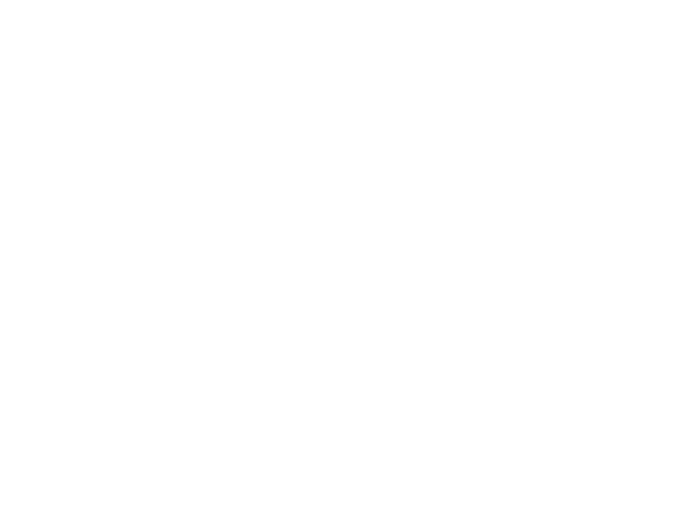

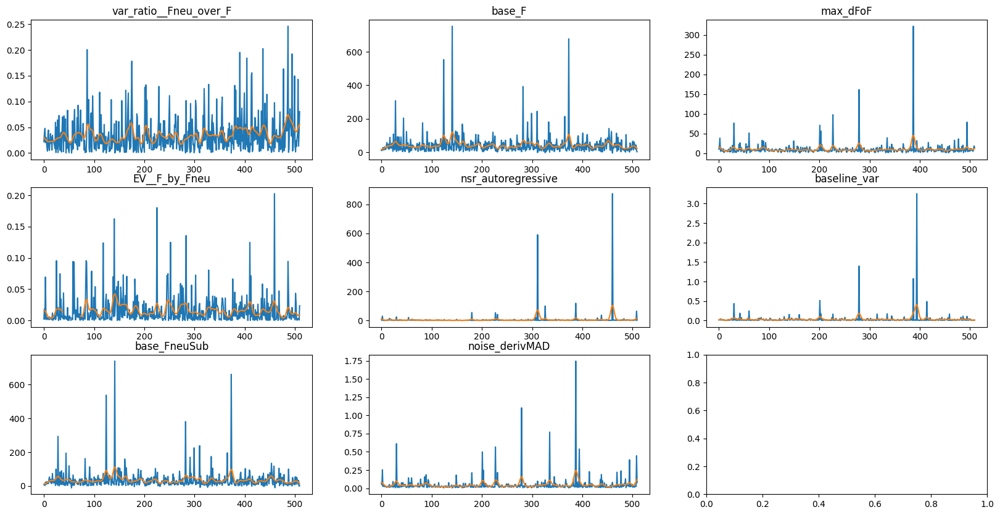

In [27]:
%matplotlib inline

n_keys = len(trace_quality['tqm']['metrics'].keys())
n_grid = int(np.ceil(n_keys**0.5))
fig, axs = plt.subplots(n_grid, n_grid, figsize=(20,10))
idx_axs = plotting_helpers.get_subplot_indices(axs)
for ii, (key, val) in enumerate(trace_quality['tqm']['metrics'].items()):
    axs[idx_axs[ii]].set_title(key)
    axs[idx_axs[ii]].plot(val[rmap.isort])
    axs[idx_axs[ii]].plot(timeSeries.simple_smooth(val[rmap.isort], sig=5))

# Pre-orthogonalization

### Define traces to orthogonalize out:
- Mean neuron trace (average vector)
    - multiple frequency components
- Mean neuropil trace
    - multiple frequency components

In [28]:
params['preorthogonalization'] = {}

params['preorthogonalization']['bandpass_freqs_boundaries'] = [0, 1/(60*5), 1/20, 1/2, 5, np.inf]
params['preorthogonalization']['mspline_grid_order'] = 3
params['preorthogonalization']['mspline_grid_numSplines'] = 4
params['preorthogonalization']['num_taps'] = 10001
params['preorthogonalization']['window'] = ('kaiser', 3.0)

In [29]:
dFoF_centered = dFoF - dFoF.mean(1, keepdims=True)
Fneu_centered = dFoF - dFoF.mean(1, keepdims=True)

dFoF_centered_mean = np.nanmean(dFoF_centered, axis=0)
Fneu_centered_mean = np.nanmean(Fneu_centered, axis=0)

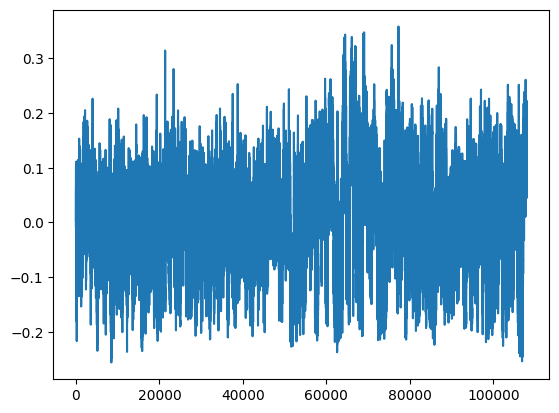

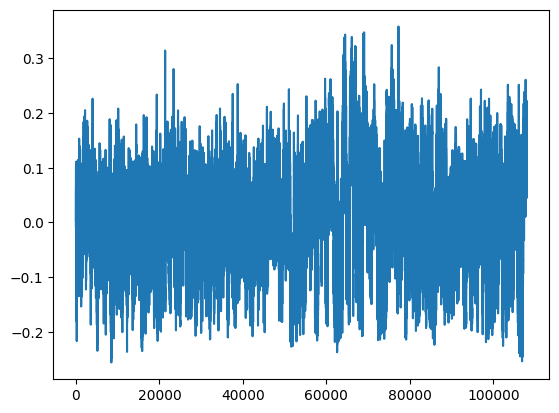

In [30]:
plt.figure()
plt.plot(dFoF_centered_mean)

plt.figure()
plt.plot(Fneu_centered_mean)

### spectral expansion

Make a set of band pass filter, then filter traces with each filter

In [31]:
bpfb = params['preorthogonalization']['bandpass_freqs_boundaries'] 

bandpass_ab = [spectral.design_fir_bandpass(bp_1, bp_2, num_taps=params['preorthogonalization']['num_taps'], fs=Fs, window=params['preorthogonalization']['window'], plot_pref=False) for ii, (bp_1, bp_2) in enumerate(zip(bpfb[:-1], bpfb[1:]))]

In [32]:
traces = [spectral.plot_digital_filter_response(b=h, fs=Fs, worN=100000, plot_pref=False) for h in tqdm(bandpass_ab)]

  0%|          | 0/5 [00:00<?, ?it/s]

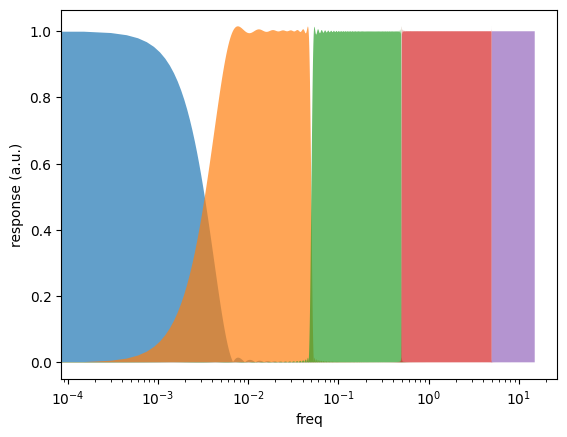

In [33]:
plt.figure()
[(plt.fill_between(t[0], t[1], alpha=0.7), plt.xscale('log'), plt.xlabel('freq'), plt.ylabel('response (a.u.)')) for t in traces];

In [34]:
sigs_list = [scipy.signal.filtfilt(h, 1.0, dFoF_centered_mean - dFoF_centered_mean.mean()) for h in tqdm(bandpass_ab)] + \
    [scipy.signal.filtfilt(h, 1.0, Fneu_centered_mean - Fneu_centered_mean.mean()) for h in tqdm(bandpass_ab[:])] + \
    [np.linspace(-1, 1, dFoF_centered.shape[1], endpoint=True)] + \
    [np.ones(dFoF.shape[1])] + \
    list(featurization.mspline_grid(order=params['preorthogonalization']['mspline_grid_order'], num_basis_funcs=params['preorthogonalization']['mspline_grid_numSplines'], nt=dFoF_centered.shape[1]))
#     list(np.stack([np.array(idx_session==ii).squeeze() for ii in range(len(idx_session))], axis=0))

sigs = np.stack(sigs_list, axis=0,).astype(np.float32)

sigs = sigs - sigs.mean(1, keepdims=True)

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


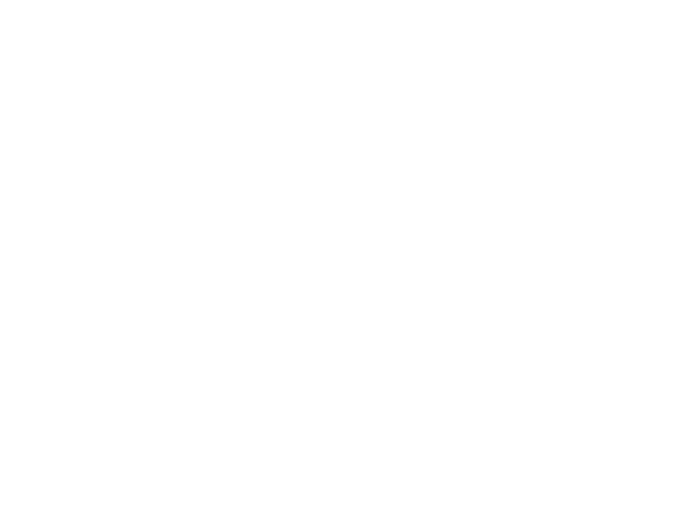

<IPython.core.display.Javascript object>


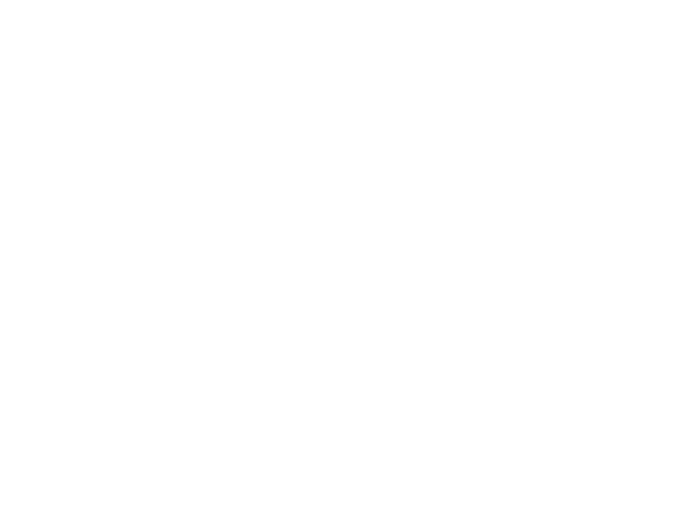

In [35]:
%matplotlib inline

plt.figure()
plt.plot(sigs.T);

plt.figure()
plt.plot(sigs[:5].sum(0))
plt.plot(dFoF_centered_mean - dFoF_centered_mean.mean())

# %matplotlib inline

In [36]:
v1_orth, EVR, EVR_total, pca_dict = similarity.orthogonalize((dFoF_centered - dFoF_centered_mean).T, sigs.T, method='OLS', device=device)

dFoF_orth = (v1_orth.T - np.percentile(v1_orth.T, params['dFoF']['percentile_baseline'], axis=1)[:,None]).astype(np.float32)

print(f"Total variance ratio in dFoF orthogonalized out: {EVR_total :.4f}")

Total variance ratio in dFoF orthogonalized out: 0.0713


In [37]:
results['preorthogonalization'] = {}

results['preorthogonalization']['signals'] = sigs
results['preorthogonalization']['EVR_total'] = EVR_total
results['preorthogonalization']['dFoF_centered_mean'] = dFoF_centered_mean
results['preorthogonalization']['Fneu_centered_mean'] = Fneu_centered_mean

In [38]:
import rastermap

In [39]:
rmap = rastermap.Rastermap(
    n_components=1,
    n_X=40,
    nPC=200,
    init='pca',
    alpha=1.0,
    K=1.0,
    mode='basic',
    verbose=True,
    annealing=True,
    constraints=2,
)

In [40]:
X = dFoF_orth.copy()
# X = dFoF_orth / np.std(dFoF_orth, axis=1, keepdims=True)
# X = timeSeries.simple_smooth(X, sig=4, axis=1)
rmap.fit(X)

nmin 200
0.07506060600280762
4.59115195274353
4.821573257446289
4.824457406997681
(38, 40)
(70,)
1.0
time; iteration;  explained PC variance
0.00s     0        0.0154      2
0.04s    10        0.1288      4
0.07s    20        0.1556      8
0.10s    30        0.2130      18
0.13s    40        0.2636      28
0.16s    50        0.3124      38
0.19s    60        0.3130      38
0.23s   final      0.3130
0.23s upsampled    0.3130


<IPython.core.display.Javascript object>


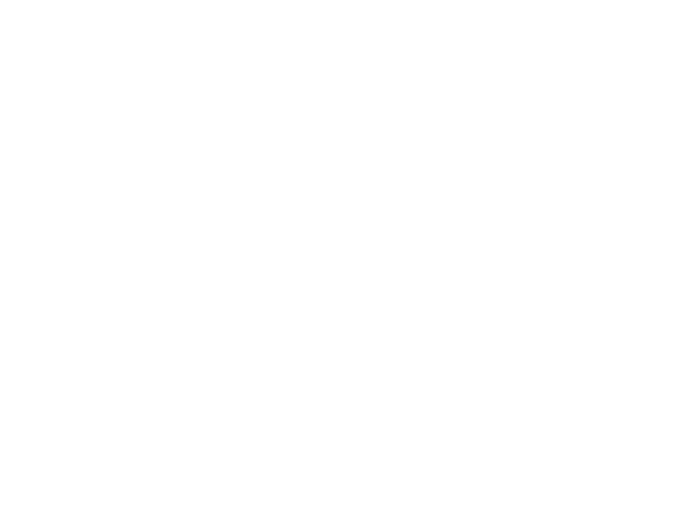

<IPython.core.display.Javascript object>


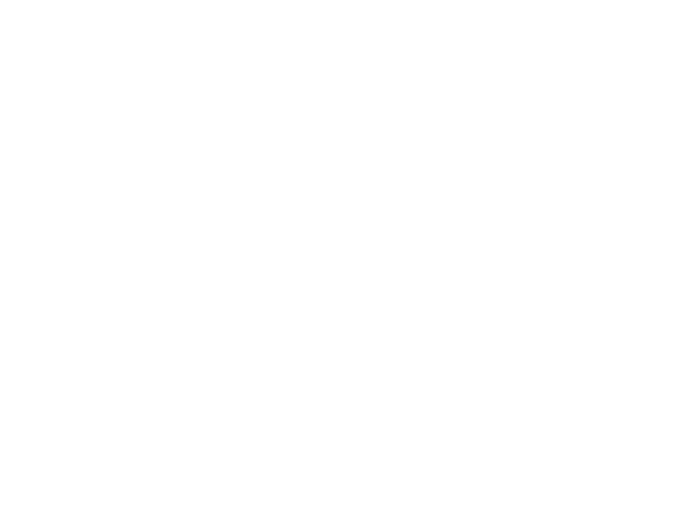

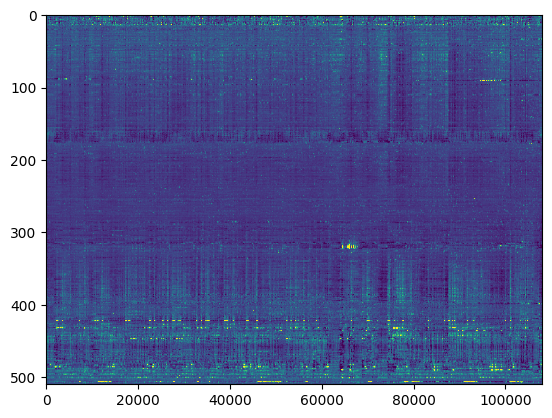

In [41]:
%matplotlib inline

plt.figure()
plt.imshow(X[rmap.isort], aspect='auto', vmin=-0.2, vmax=2)

# %matplotlib inline

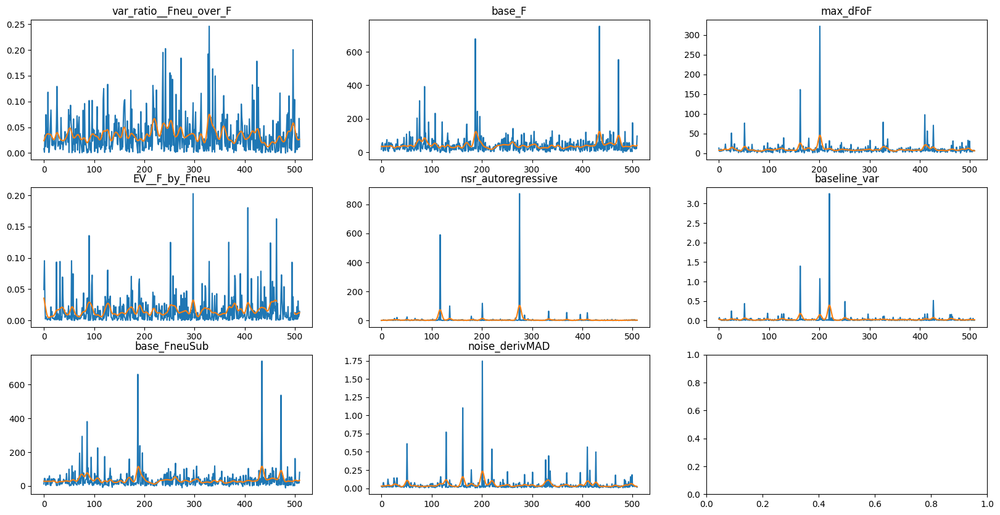

In [42]:
%matplotlib inline

n_keys = len(trace_quality['tqm']['metrics'].keys())
n_grid = int(np.ceil(n_keys**0.5))
fig, axs = plt.subplots(n_grid, n_grid, figsize=(20,10))
idx_axs = plotting_helpers.get_subplot_indices(axs)
for ii, (key, val) in enumerate(trace_quality['tqm']['metrics'].items()):
    axs[idx_axs[ii]].set_title(key)
    axs[idx_axs[ii]].plot(val[rmap.isort])
    axs[idx_axs[ii]].plot(timeSeries.simple_smooth(val[rmap.isort], sig=5))

In [53]:
params['rank_goal'] = 6

params['spca'] = {}
# params['spca']['alphas'] = [10, 20, 40, 60, 100]
# params['spca']['alphas'] = [20, 40, 60,]
params['spca']['alphas'] = [7, 9, 12]
# params['spca']['alphas'] = [3,4,5]
# params['spca']['alphas'] = [13, 15, 17]

params['spca']['tol_sweep'] = 1e-4
params['spca']['tol_final'] = 1e-6

# params['spca']['n_neurons_nonZero_goal'] = dFoF.shape[0] * 0.05
params['spca']['n_neurons_nonZero_goal'] = 100
params['spca']['n_neurons_nonZero_min'] = 30
print(f"n_neurons_nonZero_goal: {params['spca']['n_neurons_nonZero_goal']}")

neural_data_toUse = (dFoF_orth - dFoF_orth.mean(1, keepdims=True)).astype(np.float32)

n_neurons_nonZero_goal: 100


In [44]:
U, S, V = torch.svd(torch.as_tensor(neural_data_toUse.T, device=device, dtype=torch.float32), some=True)
U, S, V = U.cpu().numpy(), S.cpu().numpy(), V.cpu().numpy()
U, V = sklearn.utils.extmath.svd_flip(U, V)

spca_partials = partial(sklearn.decomposition.SparsePCA, n_components=6, ridge_alpha=0.01, max_iter=1000, method='lars', n_jobs=None, U_init=U, V_init=V, verbose=True, random_state=None)

In [45]:
spcas = {alpha: spca_partials(alpha=alpha, tol=params['spca']['tol_sweep'],) for alpha in params['spca']['alphas']}

[spca.fit(neural_data_toUse.T) for spca in tqdm(spcas.values())];

  0%|          | 0/3 [00:00<?, ?it/s]

[dict_learning] ......
[dict_learning] .......
[dict_learning] ........


In [46]:
n_neurons_nonZero = {alpha: (s.components_ != 0).sum(1).mean() for alpha,s in spcas.items()}

idx_alpha_toUse = np.abs((np.array(list(n_neurons_nonZero.values())) - params['spca']['n_neurons_nonZero_goal'])).argmin()

alpha_toUse = list(n_neurons_nonZero.keys())[idx_alpha_toUse]

In [47]:
print('Number of nonzero components for neuron loadings')
print(f"Goal number of nonzero neurons: {params['spca']['n_neurons_nonZero_goal'] :.1f}")
[print(f"alpha: {key}: {val :.1f}") for key,val in n_neurons_nonZero.items()];

Number of nonzero components for neuron loadings
Goal number of nonzero neurons: 100.0
alpha: 7: 192.8
alpha: 9: 156.2
alpha: 12: 117.0


Text(0.5, 1.0, 'Correlations of scores onto dFoF. Alpha = 7')

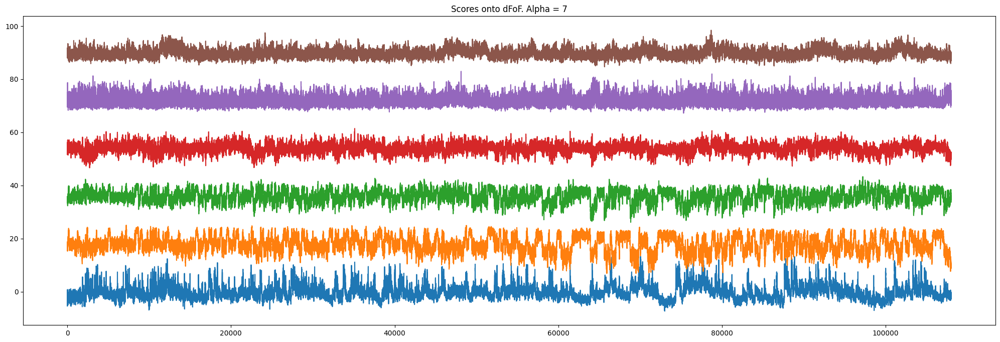

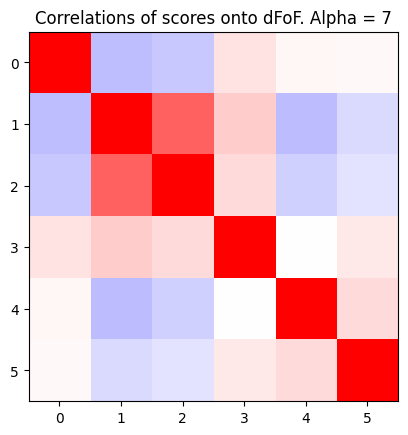

In [48]:
%matplotlib inline

idx_alpha_toShow = 0

plt.figure(figsize=(25,8))
plt.plot(spcas[params['spca']['alphas'][idx_alpha_toShow]].transform(dFoF_centered.T) + np.arange(params['rank_goal'])*10*spcas[params['spca']['alphas'][idx_alpha_toShow]].transform(dFoF_centered.T).std(1).mean());
plt.title(f"Scores onto dFoF. Alpha = {params['spca']['alphas'][idx_alpha_toShow]}")

plt.figure()
plt.imshow(np.corrcoef(spcas[params['spca']['alphas'][idx_alpha_toShow]].transform(dFoF_centered.T).T), cmap='bwr', vmin=-1, vmax=1);
plt.title(f"Correlations of scores onto dFoF. Alpha = {params['spca']['alphas'][idx_alpha_toShow]}")

In [54]:
print(f"Running final SPCA at a lower tolerance with alpha={alpha_toUse}")
tic = time.time()

spca = spca_partials(alpha=alpha_toUse, tol=params['spca']['tol_final'])
scores = spca.fit_transform(neural_data_toUse.T)

print(f"Duration: {time.time() - tic:.2f}s")

Running final SPCA at a lower tolerance with alpha=12
[dict_learning] ...................................................................................................
Duration: 91.99s


In [55]:
results['spca'] = {}

results['spca']['alpha_toUse'] = alpha_toUse
results['spca']['objs_alphaSweep'] = {alpha: spca.__dict__ for alpha,spca in spcas.items()}
results['spca']['spca_obj'] = copy.deepcopy(spca.__dict__)
results['spca']['num_nonzero_neurons'] = (spca.components_ != 0).sum(1)

In [56]:
print(f'Number of nonzero components for neuron loadings:')
print(f"Mean: {results['spca']['num_nonzero_neurons'].mean() :.1f}")
print(f"Components: {results['spca']['num_nonzero_neurons']}")

Number of nonzero components for neuron loadings:
Mean: 95.5
Components: [320 150  60  26   9   8]


In [57]:
results['spca']['inclusionBool_factors_above_min_neurons'] = params['spca']['n_neurons_nonZero_min'] < (spca.components_ != 0).sum(1)
results['spca']['n_factors_included'] = results['spca']['inclusionBool_factors_above_min_neurons'].sum()

In [58]:
print('idx of components being EXCLUDED due to low number of nonzero neurons:')
print(f"{np.where(~results['spca']['inclusionBool_factors_above_min_neurons'])[0]}")
print(f'num factors included:')
print(f"{results['spca']['n_factors_included']}")

idx of components being EXCLUDED due to low number of nonzero neurons:
[3 4 5]
num factors included:
3


Text(0.5, 1.0, 'correlation of neuron loadings')

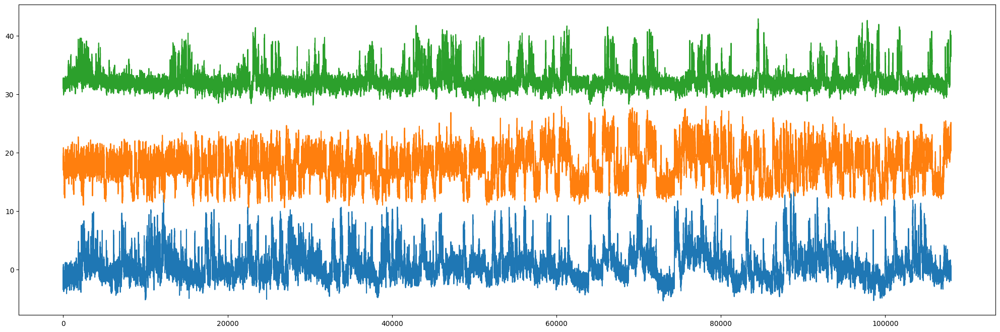

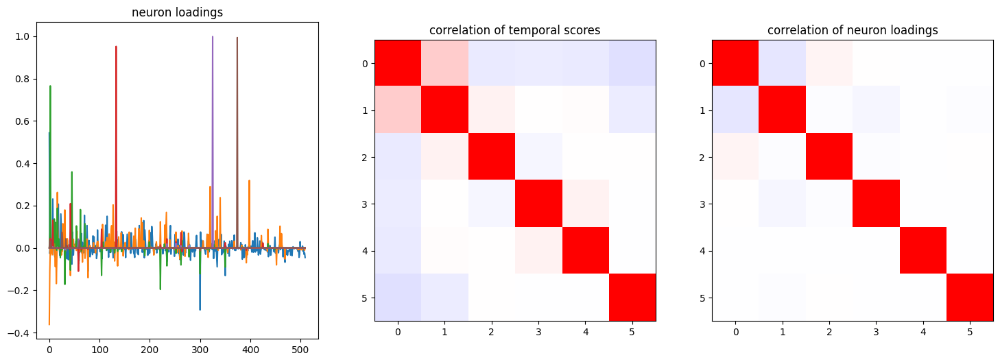

In [59]:
%matplotlib inline

plt.figure(figsize=(25,8))
plt.plot(spca.transform(dFoF.T)[:, results['spca']['inclusionBool_factors_above_min_neurons']] + np.arange(results['spca']['n_factors_included'])*10*(spca.transform(dFoF.T)[:, results['spca']['inclusionBool_factors_above_min_neurons']]).std(1).mean());

fig, axs = plt.subplots(1, 3, figsize=(18,6))
axs[0].plot(results['spca']['spca_obj']['components_'].T);
axs[0].set_title('neuron loadings')
axs[1].imshow(np.corrcoef(scores.T), cmap='bwr', vmin=-1, vmax=1)
axs[1].set_title('correlation of temporal scores')
axs[2].imshow(np.corrcoef(results['spca']['spca_obj']['components_']), cmap='bwr', vmin=-1, vmax=1)
axs[2].set_title('correlation of neuron loadings')


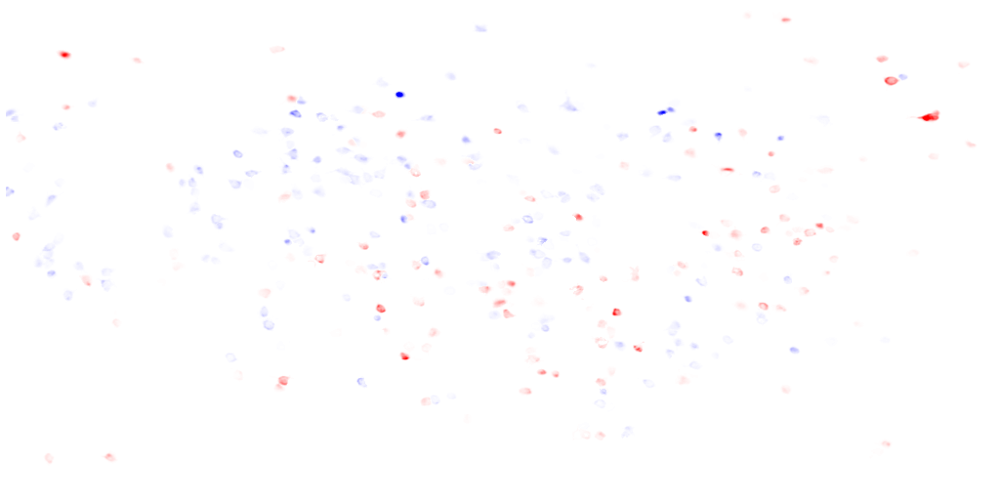

In [60]:
weights = results['spca']['spca_obj']['components_'].copy()
sf_weights = (sf.T * weights.T).T.reshape(weights.shape[0], frame_height, frame_width)

cmap = plotting_helpers.simple_cmap(
    colors=[[0,0,1],[1,1,1],[1,0,0]], 
    under=[0,0,1],
    over=[1,0,0],
    input_values=np.array([-1, 1]) * np.max(np.abs(sf_weights)) * 0.1,
    N=257,
)

roicat.visualization.display_toggle_image_stack(
    cmap(sf_weights), 
)


In [61]:
neural_data_toUse = (dFoF_orth - dFoF_orth.mean(1, keepdims=True)).astype(np.float32)

In [62]:
factors_original = results['spca']['spca_obj']['components_'][results['spca']['inclusionBool_factors_above_min_neurons']].copy()  ## shape (n_components, n_neurons)

In [63]:
scores_original = (neural_data_toUse.T @ factors_original.T).T  ## shape (n_components, n_timepoints)

In [64]:
factors_regressed, scores_regressed, bias = linear_regression.Ridge(neural_data_toUse.T, scores_original.T, lam=1*10**7, add_bias_terms=True)
factors_regressed = factors_regressed.T
scores_regressed = scores_regressed.T

In [65]:
factors_orth = bmi_idap.helpers.orthogonalize_matrix(factors_regressed)  ## shape (n_components, n_neurons)

In [66]:
scores_orth = (neural_data_toUse.T @ factors_orth.T).T  ## shape (n_components, n_timepoints)

In [67]:
factors_orth_ms = factors_orth - factors_orth.mean(1, keepdims=True)  ## shape (n_components, n_neurons)

In [68]:
factors_orth_ms_norm = factors_orth_ms / np.linalg.norm(factors_orth_ms, axis=1, keepdims=True)  ## shape (n_components, n_neurons)
scores_orth_ms_norm_raw = (dFoF.T @ factors_orth_ms_norm.T).T  ## shape (n_components, n_timepoints)

In [69]:
factors_orth_ms_norm_flipped = factors_orth_ms_norm * np.sign(scipy.stats.skew(scores_orth_ms_norm_raw, axis=1))[:,None]
scores_orth_ms_norm_flipped_raw = (dFoF.T @ factors_orth_ms_norm_flipped.T).T  ## shape (n_components, n_timepoints)

In [70]:
_, order, EVR = bmi_idap.helpers.order_factors_by_EVR(dFoF_centered, factors_orth_ms_norm_flipped, device=device)  

In [71]:
factors_orth_ms_norm_flipped_ordered = factors_orth_ms_norm_flipped[order]
scores_orth_ms_norm_flipped_ordered_raw = (neural_data_toUse.T @ factors_orth_ms_norm_flipped_ordered.T).T  ## shape (n_components, n_timepoints)

In [72]:
factors_final = factors_orth_ms_norm_flipped_ordered.copy()
scores_final = (dFoF.T @ factors_final.T).T  ## shape (n_components, n_timepoints)

In [73]:
results['factors'] = {}

results['factors']['factors_original'] = factors_original
results['factors']['factors_regressed'] = factors_regressed
results['factors']['factors_orth'] = factors_orth
results['factors']['factors_orth_ms'] = factors_orth_ms
results['factors']['factors_orth_ms_norm'] = factors_orth_ms_norm
results['factors']['factors_orth_ms_norm_flipped'] = factors_orth_ms_norm_flipped
results['factors']['factors_orth_ms_norm_ordered'] = factors_orth_ms_norm_flipped_ordered
results['factors']['factors_final'] = factors_final

results['factors']['scores_original'] = scores_original
results['factors']['scores_regressed'] = scores_regressed
results['factors']['scores_orth'] = scores_orth
results['factors']['scores_orth_ms_norm_raw'] = scores_orth_ms_norm_raw
results['factors']['scores_orth_ms_norm_flipped_raw'] = scores_orth_ms_norm_flipped_raw
results['factors']['scores_orth_ms_norm_raw_ordered'] = factors_orth_ms_norm_flipped_ordered
results['factors']['scores_final'] = scores_final


<IPython.core.display.Javascript object>


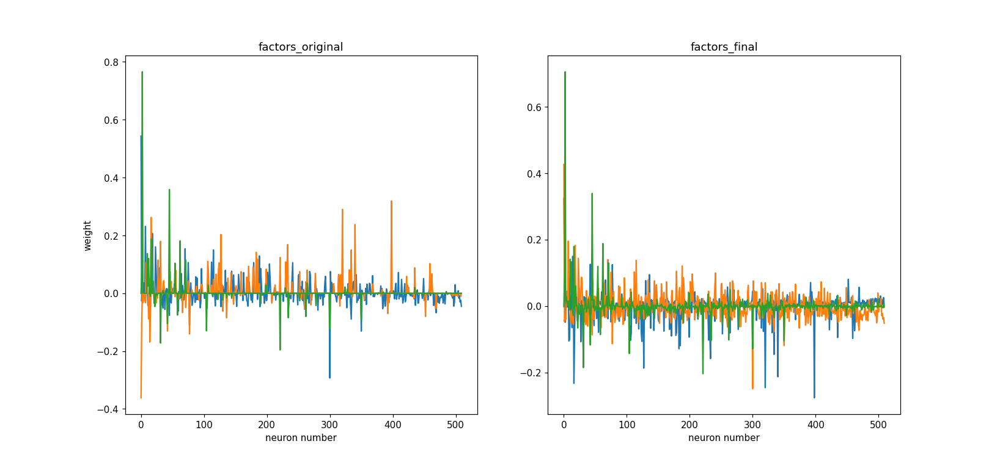

In [74]:
%matplotlib notebook
fig, axs = plt.subplots(1,2, figsize=(15, 7), sharex=True)
axs[0].plot(factors_original.T)
axs[0].set_ylabel('weight')
axs[0].set_xlabel('neuron number')
axs[0].set_title('factors_original')
axs[1].plot(factors_final.T)
axs[1].set_xlabel('neuron number')
axs[1].set_title('factors_final');

<IPython.core.display.Javascript object>


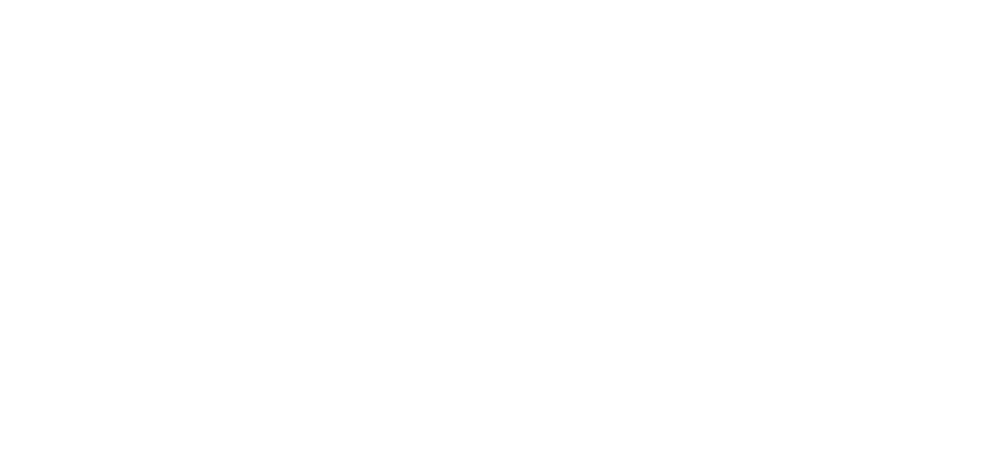

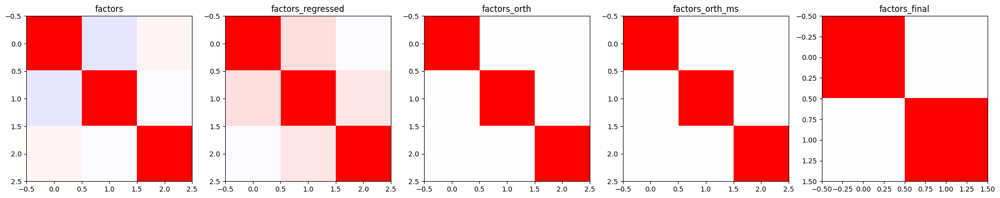

In [75]:
%matplotlib inline
fig, axs = plt.subplots(1, 5, figsize=(25,5))
axs[0].imshow(np.corrcoef(factors_original), cmap='bwr', clim=[-1,1])
axs[0].set_title('factors')
axs[1].imshow(np.corrcoef(factors_regressed), cmap='bwr', clim=[-1,1])
axs[1].set_title('factors_regressed')
axs[2].imshow(np.corrcoef(factors_orth), cmap='bwr', clim=[-1,1])
axs[2].set_title('factors_orth')
axs[3].imshow(np.corrcoef(factors_orth_ms), cmap='bwr', clim=[-1,1])
axs[3].set_title('factors_orth_ms')
axs[4].imshow(np.corrcoef(factors_final[:-1]), cmap='bwr', clim=[-1,1])
axs[4].set_title('factors_final');

Text(0.5, 1.0, 'scores_final')

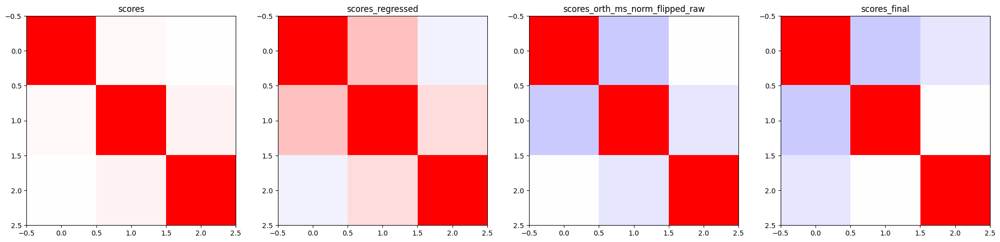

In [76]:
fig, axs = plt.subplots(1, 4, figsize=(25,6))
axs[0].imshow(np.corrcoef(scores_original), cmap='bwr', clim=[-1,1])
axs[0].set_title('scores')
axs[1].imshow(np.corrcoef(scores_regressed), cmap='bwr', clim=[-1,1])
axs[1].set_title('scores_regressed')
axs[2].imshow(np.corrcoef(scores_orth_ms_norm_flipped_raw), cmap='bwr', clim=[-1,1])
axs[2].set_title('scores_orth_ms_norm_flipped_raw')
axs[3].imshow(np.corrcoef(scores_final), cmap='bwr', clim=[-1,1])
axs[3].set_title('scores_final')


Text(0.5, 1.0, 'scores_final')

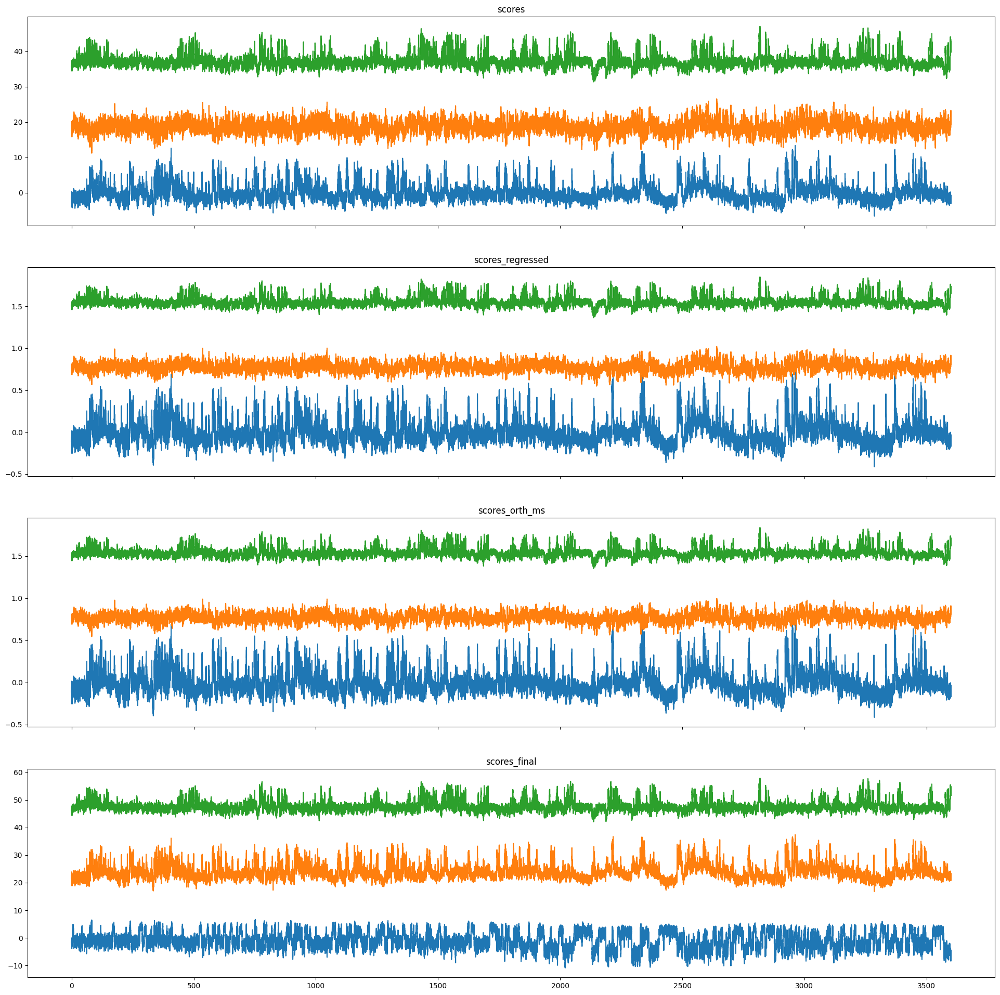

In [77]:
fig, axs = plt.subplots(4, 1, figsize=(24,24), sharex=True)
axs[0].plot(np.arange(scores_original.shape[1])/Fs,  scores_original.T + 10*scores_original.std(1).mean()*np.arange(results['spca']['n_factors_included'])[None,:]);
axs[0].set_title('scores')
axs[1].plot(np.arange(scores_original.shape[1])/Fs,  scores_regressed.T + 10*scores_regressed.std(1).mean()*np.arange(results['spca']['n_factors_included'])[None,:]);
axs[1].set_title('scores_regressed')
axs[2].plot(np.arange(scores_original.shape[1])/Fs,  scores_orth.T + 10*scores_orth.std(1).mean()*np.arange(results['spca']['n_factors_included'])[None,:]);
axs[2].set_title('scores_orth_ms')
axs[3].plot(np.arange(scores_original.shape[1])/Fs,  scores_final.T + 10*scores_final.std(1).mean()*(np.arange(results['spca']['n_factors_included']))[None,:]);
axs[3].set_title('scores_final')



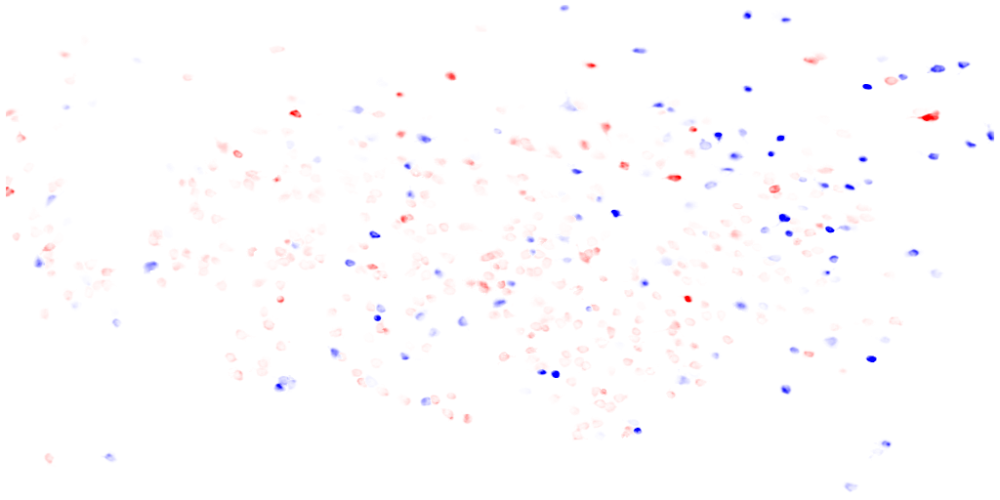

In [78]:
weights = results['spca']['spca_obj']['components_'].copy()
sf_weights = (sf.T * factors_final.T).T.reshape(factors_final.shape[0], frame_height, frame_width)

cmap = plotting_helpers.simple_cmap(
    colors=[[0,0,1],[1,1,1],[1,0,0]], 
    under=[0,0,1],
    over=[1,0,0],
    input_values=np.array([-1, 1]) * np.max(np.abs(sf_weights)) * 0.2,
    N=257,
)

roicat.visualization.display_toggle_image_stack(
    cmap(sf_weights), 
)


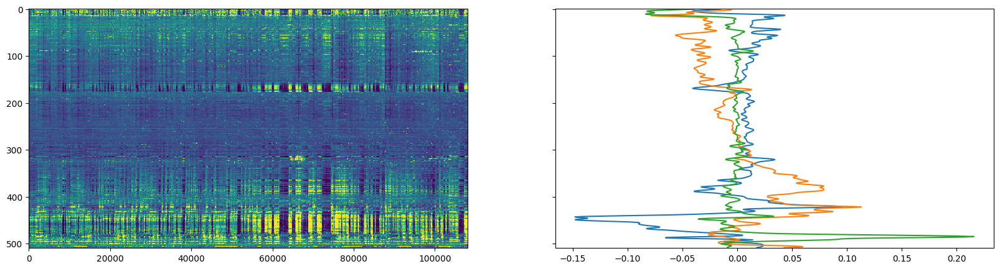

In [79]:
fig, axs = plt.subplots(1,2, figsize=(20,5), sharey=True)
axs[0].imshow(dFoF[rmap.isort], aspect='auto', vmin=-0.1, vmax=1)
axs[1].plot(timeSeries.simple_smooth(factors_final[:,rmap.isort].T, sig=3, axis=0), np.arange(factors_final.shape[1]));

In [80]:
def make_evr_power_curve(factors, data, powers=[0, 1, 2, 3, 5, 10], device='cpu'):
    decoder = bmi_idap.decoder.Decoder_angle_magnitude(
        F=factors.T,
        device=device
    )
    
    Ds = [decoder(X=data, power=p)[0] for p in powers]
    
    evrs = [similarity.orthogonalize(data.T, d.T, device=device, method='OLS')[2] for d in tqdm(Ds)]
    
    return evrs

In [81]:
components_pca, scores_pca, singVals_pca, EVR_pca = decomposition.torch_pca(neural_data_toUse.T, mean_sub=True, device=device, return_numpy=True)

In [82]:
vals_power = np.concatenate([[0], math_functions.bounded_logspace(0.1, 100, 30)])

# evrs = [make_evr_power_curve(f, neural_data_toUse, powers=vals_power, device=device) for f in [components_pca.T[:params['rank']], factors_orth_ms_ordered_norm]]
evrs = [make_evr_power_curve(f, dFoF, powers=vals_power, device=device) for f in [components_pca.T[:results['spca']['n_factors_included']], factors_final[:-1]]]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

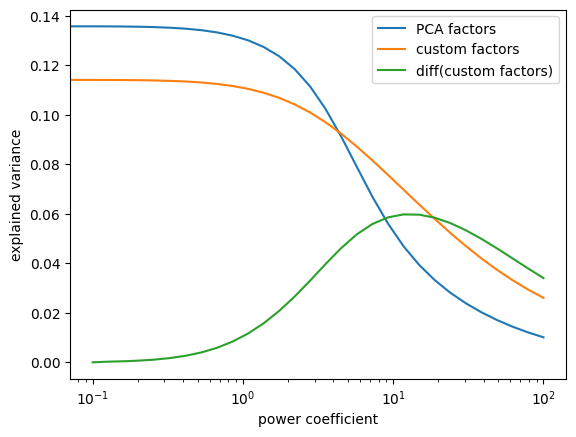

In [83]:
plt.figure()
plt.plot(vals_power, evrs[0])
plt.plot(vals_power, evrs[1])
plt.plot(vals_power[1:], np.diff(evrs[1])*-10)

plt.ylabel('explained variance')
plt.xlabel('power coefficient')
plt.xscale('log')
plt.legend(['PCA factors', 'custom factors', 'diff(custom factors)'])
# plt.ylim([0, 0.5])

In [84]:
results['manifold_alignment'] = {}

results['manifold_alignment']['components_pca'] = components_pca
results['manifold_alignment']['vals_power'] = vals_power
results['manifold_alignment']['evrs_pca'] = evrs[0]
results['manifold_alignment']['evrs_factors'] = evrs[1]

In [102]:
params['simulation'] = {}

params['simulation']['idx_factor'] = 1  ## 0-indexed
params['simulation']['power'] = 2.0
params['simulation']['thresh_reward'] = 6.0
params['simulation']['thresh_quiescence_cursorDecoder'] = 0.1 * params['simulation']['thresh_reward']
params['simulation']['thresh_quiescence_cursorMag'] = 0.1

params['simulation']['duration_quiescence_hold'] = 3
params['simulation']['duration_threshold_hold'] = 3
params['simulation']['win_smooth_cursor'] = 1

In [103]:
decoder = bmi_idap.decoder.Decoder_angle_magnitude(
    F=results['factors']['factors_final'].T,
    device=device,
    power=params['simulation']['power'],
)

D, CS, M = decoder(dFoF)

In [104]:
params['simulation']['thresh_quiescence_cursorMag'] = max([torch.quantile(M[params['simulation']['idx_factor']], q=params['simulation']['thresh_quiescence_cursorMag']).item(), 0])


In [105]:
num_rewards, sm = bmi_idap.decoder.simple_cursor_simulation(
    D.T, 
    CS.T, 
    M.T,
    idx_cursor=params['simulation']['idx_factor'], 
    thresh_reward=params['simulation']['thresh_reward'], 
    thresh_quiescence_cursorMag=params['simulation']['thresh_quiescence_cursorMag'], 
    thresh_quiescence_cursorDecoder=params['simulation']['thresh_quiescence_cursorDecoder'], 
    duration_quiescence_hold=params['simulation']['duration_quiescence_hold'],
    duration_threshold_hold=params['simulation']['duration_threshold_hold'],
    win_smooth_cursor=1,
)

100%|████████████████████████████████| 108000/108000 [00:08<00:00, 12103.86it/s]


In [106]:
rewards_per_min = num_rewards / (D.shape[1] / (Fs*60*1))

print(f"Rewards per minute: {rewards_per_min :.3f}")

Rewards per minute: 1.233


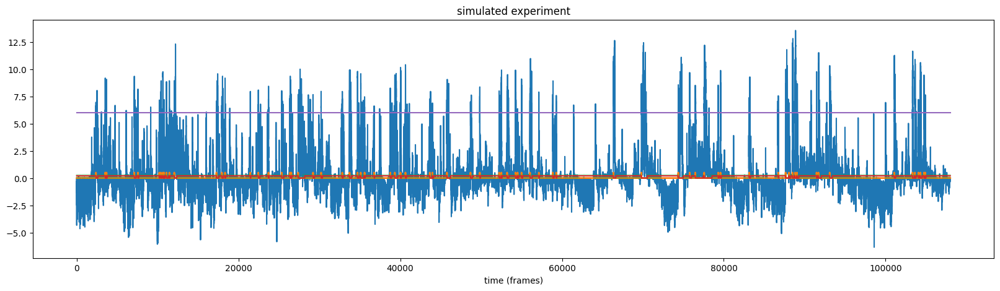

In [107]:
plt.figure(figsize=(20,5))
plt.plot(sm['cursor'])
plt.plot(sm['rewards']*0.5, linewidth=2)
plt.plot(sm['CS_quiescence']*0.3, alpha=0.3)
plt.plot(sm['CE_trial']*0.2)
plt.plot([0, D.shape[1]], [params['simulation']['thresh_reward'], params['simulation']['thresh_reward']])
plt.title('simulated experiment')
plt.xlabel('time (frames)');

In [108]:
results['simulation'] = {}

results['simulation']['idx_factor'] = params['simulation']['idx_factor']
results['simulation']['D'] = D
results['simulation']['CS'] = CS
results['simulation']['M'] = M
results['simulation']['num_rewards'] = num_rewards
results['simulation']['rewards_per_min'] = rewards_per_min
results['simulation']['sm'] = sm

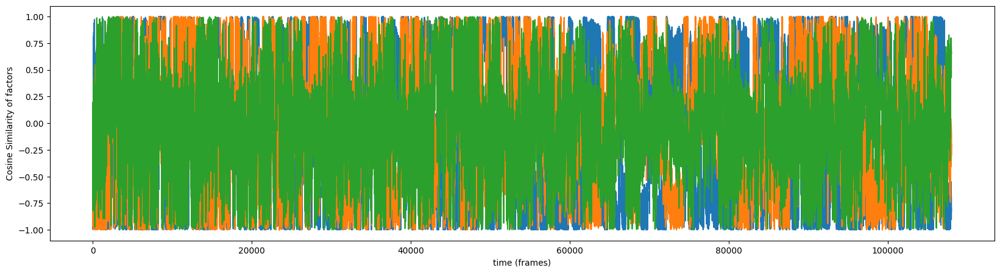

In [109]:
plt.figure(figsize=(20,5))
plt.plot(CS.T.cpu());
plt.xlabel('time (frames)')
plt.ylabel('Cosine Similarity of factors');

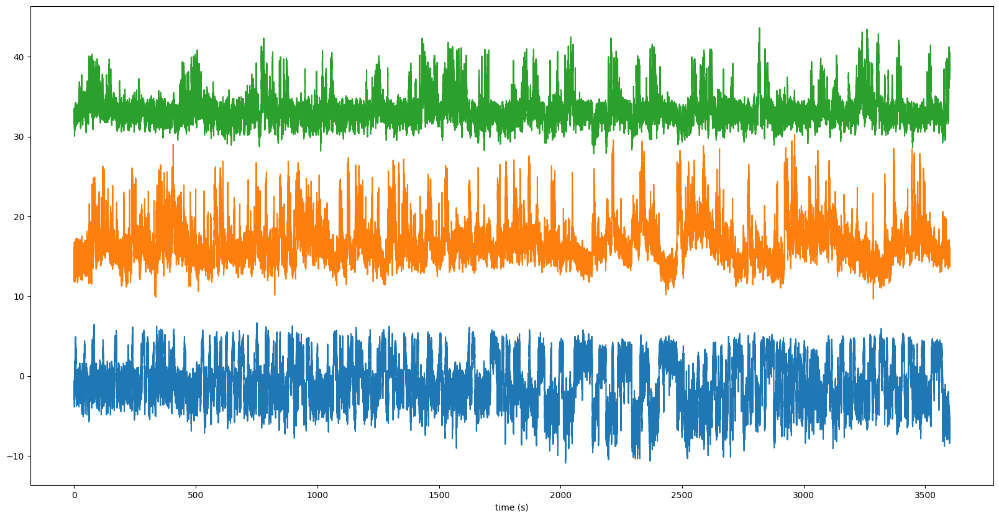

In [110]:
plt.figure(figsize=(20,10))
plt.plot(np.arange(M.shape[1])/Fs, (M.cpu() + torch.arange(M.shape[0])[:,None]*M.std(1).mean().cpu()*7).T)
plt.xlabel('time (s)');

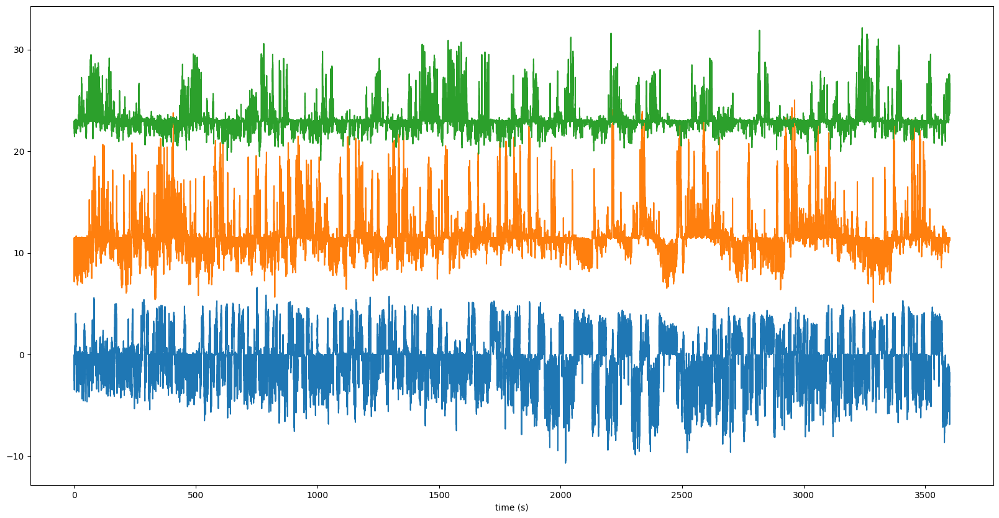

In [111]:
plt.figure(figsize=(20,10))
plt.plot(np.arange(D.shape[1])/Fs, (D.cpu() + torch.arange(D.shape[0])[:,None]*D.std(1).mean().cpu()*7).T)
plt.xlabel('time (s)');

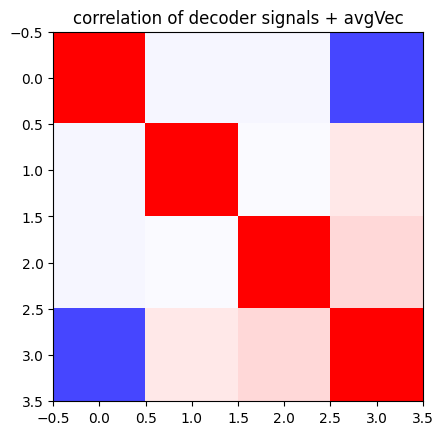

In [112]:
plt.figure()
plt.imshow(
    np.corrcoef(np.concatenate(
        (D.cpu(), dFoF.mean(0)[None,:]), axis=0   
    )), vmin=-1, vmax=1, cmap='bwr'
);
plt.title('correlation of decoder signals + avgVec');

In [113]:
directions = np.arange(results['spca']['n_factors_included']) * (360 / results['spca']['n_factors_included'])

In [114]:
x, y = np.cos(np.deg2rad(directions)), np.sin(np.deg2rad(directions))
xy = np.stack((x,y), axis=1)
np.random.shuffle(xy)

In [115]:
test1 = M.T.cpu().numpy() @ xy
test2 = D.T.cpu().numpy() @ xy

In [116]:
test3 = np.einsum('ij,ik -> ikj', M.cpu().numpy(), xy)

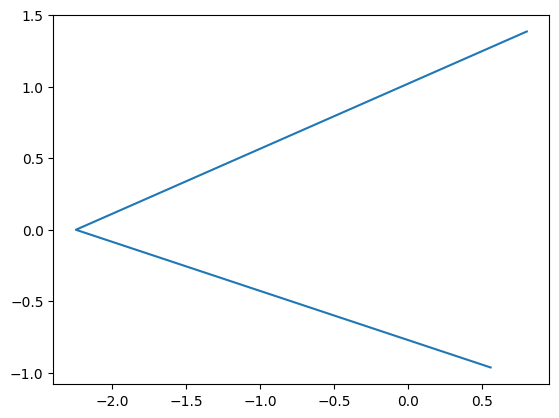

In [117]:
plt.figure()
plt.plot(test3[:,0,0], test3[:,1,0])

(-7.0, 7.0)

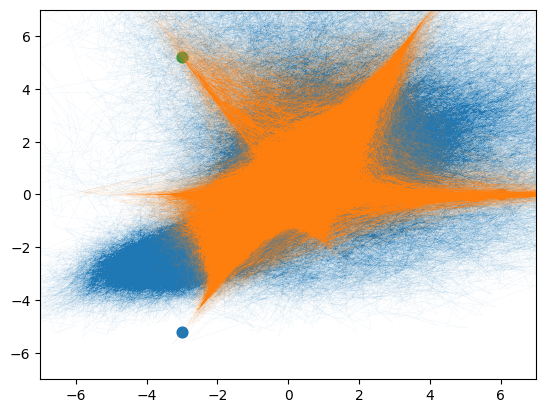

In [118]:
%matplotlib inline

plt.figure()
[plt.scatter(xy[ii,0]*6, xy[ii,1]*6, s=60) for ii in range(len(x))]
plt.plot(test1[:,0], test1[:,1], linewidth=0.02)
plt.plot(test2[:,0], test2[:,1], linewidth=0.02)
plt.xlim([-7, 7])
plt.ylim([-7, 7])

visualization of final traces and masks

# Save it all

In [ ]:
tqm = file_helpers.pickle_load(params['paths']['trace_quality'])
params['tqm']['metrics'] = tqm['metrics']

In [119]:
file_helpers.json_save(params, str((Path(params['paths']['path_save_results']).parent / 'params_day0_2').with_suffix('.json')))

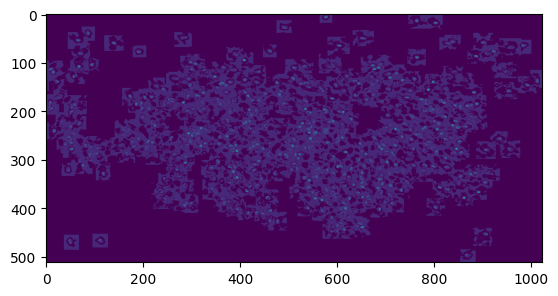

In [120]:
plt.figure()
plt.imshow(results['ROIs']['spatial_footprints'].max(0).A.reshape((512,1024)) + results['ROIs']['sfneu'].max(0).A.reshape((512,1024))/100)

In [121]:
sfm_coo = results['ROIs']['spatial_footprints'].tocoo()
fn_coo = results['ROIs']['sfneu'].tocoo()

weights_day0 = {
    "factors" : results['factors']['factors_final'],
#     "iscell_custom": results['data']['iscell'],
    "spatialFootprints_scipy": results['ROIs']['spatial_footprints'],
    "neuropilMasks_scipy":     results['ROIs']['sfneu'],
    "spatialFootprints_COO_1idx": {
        "row": sfm_coo.row + 1,
        "col": sfm_coo.col + 1,
        "data": sfm_coo.data,
        "shape": sfm_coo.shape,
    },
    "neuropilMasks_COO_1idx": {
        "row": fn_coo.row + 1,
        "col": fn_coo.col + 1,
        "data": fn_coo.data,
        "shape": fn_coo.shape,
    },
    "FOV_height": results['data']['frame_height'],
    "FOV_width":  results['data']['frame_width'],
    "refImg": ops['refImg'],
    "params": params,
}

scipy.io.savemat(str(Path(params['paths']['path_save_weights']).with_suffix('.mat')) , weights_day0)
np.save(str(Path(params['paths']['path_save_weights']).with_suffix('.npy')) , weights_day0)


file_helpers.pickle_save(
    obj={'results': results, 'params': params},
    filepath=str(Path(params['paths']['path_save_results']).with_suffix('.pkl')),
)

In [11]:
params = file_helpers.json_load('/media/rich/bigSSD/analysis_data/BMI/day0_stuff/mouse_0403L/params_day0_2.json')

In [12]:
tqm = file_helpers.pickle_load(params['paths']['trace_quality'])['tqm']
params['tqm'] = {}
params['tqm']['thresh'] = tqm['thresh']

In [14]:
file_helpers.json_save(
    obj=params,
    filepath='/home/rich/Desktop/params_day0_2_new.json'
)